In [ ]:
#ad the dataset
!wget https://github.com/Jakobovski/free-spoken-digit-dataset/archive/refs/heads/master.zip

#unzip the dataset folder
! unzip master.zip

--2022-11-07 01:26:45--  https://github.com/Jakobovski/free-spoken-digit-dataset/archive/refs/heads/master.zip
Resolving github.com (github.com)... 20.205.243.166
Connecting to github.com (github.com)|20.205.243.166|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://codeload.github.com/Jakobovski/free-spoken-digit-dataset/zip/refs/heads/master [following]
--2022-11-07 01:26:45--  https://codeload.github.com/Jakobovski/free-spoken-digit-dataset/zip/refs/heads/master
Resolving codeload.github.com (codeload.github.com)... 20.205.243.165
Connecting to codeload.github.com (codeload.github.com)|20.205.243.165|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [application/zip]
Saving to: ‘master.zip’

master.zip              [      <=>           ]  15.66M  14.7MB/s    in 1.1s    

2022-11-07 01:26:47 (14.7 MB/s) - ‘master.zip’ saved [16421388]

Archive:  master.zip
4c3b0983b1b7f46ec5e49ca527e8e8844a81107e
   creating: fre

In [ ]:
#
import os
from os import listdir
from os.path import isfile, join
from matplotlib import pyplot as plt
import scipy.io.wavfile as wav
import numpy as np
from keras.preprocessing import image
from keras.utils.np_utils import to_categorical


import IPython.display as ipd
import librosa
import librosa.display
import pandas as pd

**Exploratory Data Analysis**

In [ ]:
filename = 'recordings/0_george_2.wav'

Displaying the "**0_george_2**" audio file in the form of a wave using **librosa** and **Ipython** Libraries

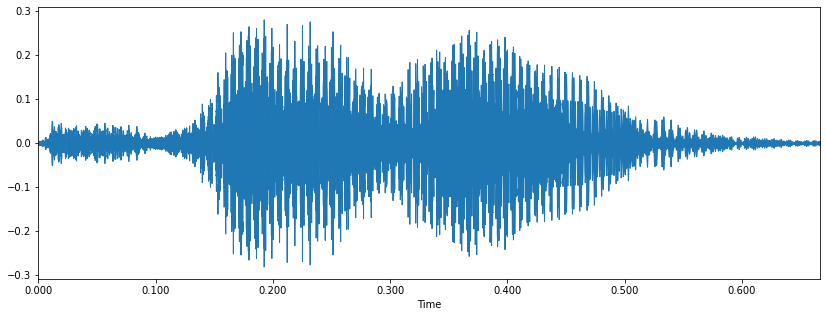

In [ ]:
plt.figure(figsize=(14,5))
data,sample_rate = librosa.load(filename)
librosa.display.waveplot(data,sr=sample_rate)
ipd.Audio(filename)

In [ ]:
sample_rate

22050

**Data Preprocessing**


Function to convert audio file(wav form) to spectrogram


In [ ]:
def wav_to_spectrogram(audio_path, save_path, spectrogram_dimensions=(64, 64), noverlap=16, cmap='gray_r'):
  sample_rate, samples = wav.read(audio_path)
  fig = plt.figure()
  fig.set_size_inches((spectrogram_dimensions[0]/fig.get_dpi(), spectrogram_dimensions[1]/fig.get_dpi()))
  ax = plt.Axes(fig, [0., 0., 1., 1.])
  ax.set_axis_off()
  fig.add_axes(ax)
  ax.specgram(samples, cmap=cmap, Fs=2, noverlap=noverlap)
  ax.xaxis.set_major_locator(plt.NullLocator())
  ax.yaxis.set_major_locator(plt.NullLocator())
  fig.savefig(save_path, bbox_inches="tight", pad_inches=0)

Function to apply **wav_to_spectrogram** to all the files in the recordings directory

In [ ]:
def dir_to_spectrogram(audio_dir, spectrogram_dir, spectrogram_dimensions=(64, 64), noverlap=16, cmap='gray_r'):
  file_names = [f for f in listdir(audio_dir) if isfile(join(audio_dir, f)) and '.wav' in f]
  for file_name in file_names:
    print(file_name)
    audio_path = audio_dir + file_name
    spectogram_path = spectrogram_dir + file_name.replace('.wav', '.png')
    wav_to_spectrogram(audio_path, spectogram_path, spectrogram_dimensions=spectrogram_dimensions, noverlap=noverlap, cmap=cmap)

Running the **dir_to_spectrogram** function to convert the wav files in the recordings folder to spectrograms in the spectrograms folder

4_nicolas_2.wav
4_nicolas_31.wav
9_george_9.wav
2_yweweler_16.wav
0_george_5.wav
0_george_46.wav
5_yweweler_44.wav
9_george_22.wav
5_george_21.wav
6_george_7.wav
1_theo_12.wav
3_nicolas_2.wav
2_nicolas_45.wav
3_lucas_27.wav
8_yweweler_6.wav
9_lucas_20.wav
4_nicolas_13.wav
8_yweweler_48.wav
1_yweweler_42.wav
5_theo_13.wav
7_yweweler_17.wav
9_yweweler_10.wav
3_jackson_42.wav
2_jackson_11.wav
3_theo_43.wav
0_theo_5.wav
9_yweweler_33.wav


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


6_theo_23.wav
2_nicolas_46.wav
3_nicolas_26.wav
5_jackson_41.wav
6_lucas_34.wav
0_theo_1.wav
3_george_19.wav
9_nicolas_26.wav
9_nicolas_29.wav
2_jackson_39.wav
6_theo_36.wav
7_theo_15.wav
6_george_11.wav
2_lucas_28.wav
7_jackson_5.wav
9_yweweler_46.wav
4_yweweler_40.wav
5_nicolas_22.wav
9_nicolas_48.wav
0_george_24.wav
6_george_13.wav
7_nicolas_14.wav
5_lucas_17.wav
2_nicolas_32.wav
1_jackson_2.wav
8_nicolas_0.wav
7_yweweler_2.wav
6_nicolas_32.wav
1_nicolas_1.wav
5_theo_21.wav
4_lucas_45.wav
2_yweweler_32.wav
2_nicolas_41.wav
7_theo_34.wav
9_yweweler_14.wav
1_george_22.wav
6_george_34.wav
4_lucas_0.wav
4_theo_21.wav
7_george_45.wav
9_lucas_9.wav
7_jackson_38.wav
7_nicolas_13.wav
4_jackson_31.wav
9_theo_45.wav
3_george_10.wav
6_theo_33.wav
8_yweweler_0.wav
5_theo_5.wav
9_jackson_48.wav
4_yweweler_31.wav
0_theo_35.wav
0_lucas_36.wav
4_jackson_11.wav
3_jackson_33.wav
6_george_17.wav
7_nicolas_18.wav
3_george_34.wav
0_yweweler_15.wav
1_lucas_13.wav
2_lucas_21.wav
9_nicolas_8.wav
3_theo_46.

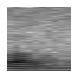

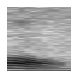

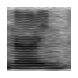

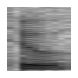

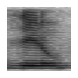

...

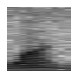

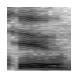

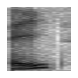

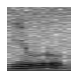

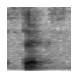

In [ ]:
audio_folder = "recordings/"
spectrogram_folder = "spectrograms/"
dir_to_spectrogram(audio_folder, spectrogram_folder)

Importing the required libraries

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from keras.preprocessing import image
from keras.utils.np_utils import to_categorical
from tensorflow.keras.utils import load_img, img_to_array

Splitting the spectograms into train and test sets

In [ ]:
imagesDir = "spectrograms/"
trainset = [] # Creating two sets (train and test) 
testset = []
for file in os.listdir(imagesDir):
  label = file.split('_')[0]
  sample_number = file.split('_')[2]
  img = load_img(imagesDir+file)
  if sample_number in ['0.png','1.png','2.png','3.png','4.png']:
    testset.append([img_to_array(img), label])
  else:
    trainset.append([img_to_array(img), label])

Seperating the images(X) and labels(Y) in train and test

In [ ]:
# Get only images in the train list not the Labels
X_train = [item[0] for item in trainset]
# Get only Labels in the train list not the images
y_train = [item[1] for item in trainset]
# Get only images in the test list not the Labels
X_test = [item[0] for item in testset]
# Get only Labels in the test list not the images
y_test = [item[1] for item in testset]

In [ ]:
# Convert list to numpy array in order to define input shape
X_train = np.asanyarray(X_train)
y_train = np.asanyarray(y_train)
X_test = np.asanyarray(X_test)
y_test = np.asanyarray(y_test)

In [ ]:
# convert to one hot representation
y_train = to_categorical(y_train)
y_test = to_categorical(y_test)

#Normalize the images
X_train /= 255
X_test /= 255

**Designing the Models**

Importing dependencies

In [ ]:
from keras.models import Sequential 
from keras import optimizers
from keras.layers import Dense, Activation, Flatten, Conv2D, MaxPooling2D, Dropout, BatchNormalization
from keras import models
import tensorflow as tf
from sklearn.metrics import confusion_matrix,classification_report
import test

### **Model_1 - CNN Model | 3 CNN Layers with BatchNormalization and many Dropout Layers**


Defining a CNN Model

In [ ]:
data_shape = (X_train.shape[1], X_train.shape[2], X_train.shape[3])
def cnn():
  model = Sequential()
  model.add(Conv2D(32, kernel_size=(2, 2), activation='relu', input_shape=data_shape))
  model.add(BatchNormalization())
  model.add(Conv2D(48, kernel_size=(2, 2), activation='relu'))
  model.add(BatchNormalization())
  model.add(Conv2D(120, kernel_size=(2, 2), activation='relu'))
  model.add(BatchNormalization())
  model.add(MaxPooling2D(pool_size=(2, 2)))
  model.add(Dropout(0.25))
  model.add(Flatten())
  model.add(Dense(128, activation='relu'))
  model.add(BatchNormalization())
  model.add(Dropout(0.25))
  model.add(Dense(64, activation='relu'))
  model.add(BatchNormalization())
  model.add(Dropout(0.4))
  model.add(Dense(10, activation='softmax'))

  model.compile(loss = 'categorical_crossentropy', optimizer='Adadelta', metrics=['accuracy'])
  return model

In [ ]:
model = cnn()
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_6 (Conv2D)           (None, 63, 63, 32)        416       
                                                                 
 batch_normalization (BatchN  (None, 63, 63, 32)       128       
 ormalization)                                                   
                                                                 
 conv2d_7 (Conv2D)           (None, 62, 62, 48)        6192      
                                                                 
 batch_normalization_1 (Batc  (None, 62, 62, 48)       192       
 hNormalization)                                                 
                                                                 
 conv2d_8 (Conv2D)           (None, 61, 61, 120)       23160     
                                                                 
 batch_normalization_2 (Batc  (None, 61, 61, 120)     

In [ ]:
history = model.fit(X_train, y_train, batch_size = 50, validation_split=0.2, epochs = 100, verbose = 1)

Epoch 1/100
44/44 [==============================] - 4s 63ms/step - loss: 3.2127 - accuracy: 0.1269 - val_loss: 2.3774 - val_accuracy: 0.0944
Epoch 2/100
44/44 [==============================] - 2s 44ms/step - loss: 2.7407 - accuracy: 0.1958 - val_loss: 2.4950 - val_accuracy: 0.0944
Epoch 3/100
44/44 [==============================] - 2s 42ms/step - loss: 2.4588 - accuracy: 0.2384 - val_loss: 2.5996 - val_accuracy: 0.0944
Epoch 4/100
44/44 [==============================] - 2s 42ms/step - loss: 2.2489 - accuracy: 0.2875 - val_loss: 2.6548 - val_accuracy: 0.0944
Epoch 5/100
44/44 [==============================] - 2s 42ms/step - loss: 2.1023 - accuracy: 0.3218 - val_loss: 2.6525 - val_accuracy: 0.0944
Epoch 6/100
44/44 [==============================] - 2s 43ms/step - loss: 1.9245 - accuracy: 0.3750 - val_loss: 2.6123 - val_accuracy: 0.0944
Epoch 7/100
44/44 [==============================] - 2s 43ms/step - loss: 1.8259 - accuracy: 0.4102 - val_loss: 2.5237 - val_accuracy: 0.1019
Epoch 

Visualising the accuracy and validation accuaracy

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.set_style("darkgrid")
#get the details form the history object
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) + 1)

#Train and validation accuracy
plt.plot(epochs, acc, 'b', label='Training accurarcy')
plt.plot(epochs, val_acc, 'r', label='Validation accurarcy')
plt.xlabel('Epoch #')
plt.ylabel('accuracy')
plt.title('Training and Validation accurarcy')
plt.legend()
#plt.savefig('ensemble_seresnext50_eff-b3_graph_test_acc.png')

plt.figure()
#Train and validation loss
plt.plot(epochs, loss, 'b', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.xlabel('Epoch #')
plt.ylabel('loss')
plt.title('Training and Validation loss')
plt.legend()
#plt.savefig('ensemble_seresnext50_eff-b3_graph_test_loss.png')

plt.show()

Evaluating the model by the testing data

In [ ]:
results = model.evaluate(X_test, y_test)

10/10 [==============================] - 0s 9ms/step - loss: 0.2204 - accuracy: 0.9500


In [ ]:
print('Test accuracy: ', results[1])

Test accuracy:  0.949999988079071


We get an accuracy of **95%** which is good but we experiment further.

In [ ]:
Y_pred1 = model.predict(X_test, len(y_test)//32)
y_pred1 = np.argmax(Y_pred1, axis=1)
rounded_labels = np.argmax(y_test, axis=1)

34/34 [==============================] - 0s 4ms/step


In [ ]:
rounded_labels

array([5, 3, 6, 8, 4, 7, 8, 2, 2, 0, 3, 4, 4, 4, 1, 0, 1, 4, 0, 9, 9, 2,
       3, 8, 7, 3, 8, 2, 0, 8, 2, 5, 7, 3, 6, 3, 4, 2, 6, 0, 8, 6, 3, 0,
       0, 9, 8, 6, 0, 7, 7, 7, 7, 3, 5, 5, 2, 8, 8, 4, 5, 5, 1, 1, 1, 9,
       2, 7, 1, 6, 3, 5, 1, 4, 0, 9, 0, 9, 5, 5, 0, 7, 9, 4, 2, 4, 0, 0,
       5, 9, 2, 4, 4, 8, 5, 4, 6, 1, 3, 8, 8, 7, 4, 8, 0, 6, 1, 3, 7, 7,
       1, 5, 7, 3, 7, 7, 8, 0, 3, 2, 5, 9, 7, 5, 7, 4, 1, 9, 0, 6, 4, 8,
       6, 3, 4, 0, 9, 6, 2, 9, 3, 4, 5, 9, 3, 2, 4, 4, 4, 3, 7, 2, 7, 1,
       1, 4, 7, 1, 5, 2, 3, 8, 9, 2, 0, 1, 9, 3, 7, 0, 9, 4, 7, 6, 6, 1,
       2, 6, 4, 7, 9, 0, 5, 2, 3, 5, 8, 3, 3, 6, 2, 8, 5, 0, 6, 8, 6, 2,
       3, 1, 6, 9, 5, 8, 9, 2, 7, 1, 9, 5, 0, 4, 2, 9, 0, 3, 4, 6, 5, 9,
       1, 5, 6, 5, 3, 9, 8, 9, 6, 2, 5, 8, 8, 0, 6, 8, 4, 8, 0, 0, 4, 0,
       9, 0, 9, 3, 6, 0, 7, 3, 1, 3, 1, 1, 1, 5, 3, 8, 9, 6, 1, 8, 7, 5,
       7, 2, 9, 3, 8, 2, 6, 6, 1, 6, 1, 7, 1, 5, 9, 8, 6, 1, 5, 2, 7, 1,
       2, 7, 4, 2, 5, 8, 0, 9, 2, 2, 4, 6, 1, 6])

In [ ]:
print('Confusion Matrix')
cm = confusion_matrix(rounded_labels, y_pred1)
#cm = confusion_matrix(test_RGB_y, y_pred1)
print(cm)

Confusion Matrix
[[30  0  0  0  0  0  0  0  0  0]
 [ 0 29  0  0  0  0  0  1  0  0]
 [ 0  0 29  1  0  0  0  0  0  0]
 [ 0  0  0 29  0  0  0  0  1  0]
 [ 0  0  0  0 30  0  0  0  0  0]
 [ 0  0  0  0  0 29  0  0  0  1]
 [ 0  0  0  2  0  0 27  0  1  0]
 [ 0  0  0  0  0  0  0 30  0  0]
 [ 0  1  0  1  0  0  3  2 23  0]
 [ 0  1  0  0  0  0  0  0  0 29]]


In [ ]:
array_downsize_upsize_random = cm

class_labels=["0", "1","2","3","4","5","6","7","8","9"]

confusion_matrix = pd.DataFrame(array_downsize_upsize_random, index=class_labels, columns=class_labels)
plt.figure(figsize=(10,10))
sn.set(font_scale=1.4) # for label size
g = sn.heatmap(confusion_matrix, annot=True, annot_kws={"size": 10}, cmap=plt.cm.Blues, fmt="g", linewidths=2, linecolor='grey',cbar=False, yticklabels=class_labels,xticklabels=class_labels) # font size

g.set_xticklabels(g.get_xticklabels(), rotation = 45)#, fontsize = 1)
# accuracy = np.trace(array_downsize_upsize_random) / np.sum(array_downsize_upsize_random).astype('float')
# misclass = 1 - accuracy
plt.tight_layout()
plt.ylabel('True Class')
plt.xlabel('Predicted Class')#\naccuracy={:0.4f}; misclass={:0.4f}'.format(accuracy, misclass))
#plt.savefig('Downsize+Upsize_Random.png')#, dpi = 1200)
plt.show()

Saving the model for prediction 

In [ ]:
model.save("spoken_digit_recognition_.h5")

In [ ]:
index = 11
print('ground Truth',np.argmax(y_test[index]))
print('Prediction' ,np.argmax(model.predict(X_test[index].reshape(1,64,64,3))))

ground Truth 4
1/1 [==============================] - 0s 374ms/step
Prediction 4


In [ ]:
index = 13
print('ground Truth',np.argmax(y_test[index]))
print('Prediction' ,np.argmax(model.predict(X_test[index].reshape(1,64,64,3))))

ground Truth 4
1/1 [==============================] - 0s 61ms/step
Prediction 4


Even this model with 3 CNN Layers **doesn't predict** the number correctly.


### **Model 2 - CNN Model | 2 CNN Layers**

Defining the CNN Model

In [ ]:
data_shape = (X_train.shape[1], X_train.shape[2], X_train.shape[3])
def cnn_1():
  model = Sequential()
  model.add(Conv2D(32, kernel_size=(2, 2), activation='relu', input_shape=data_shape))
  model.add(BatchNormalization())
  model.add(Conv2D(48, kernel_size=(2, 2), activation='relu'))
  model.add(BatchNormalization())

  model.add(MaxPooling2D(pool_size=(2, 2)))
  model.add(Dropout(0.25))
  
  model.add(Flatten())
  model.add(Dense(128, activation='relu'))
  model.add(BatchNormalization())
  model.add(Dropout(0.25))
  model.add(Dense(64, activation='relu'))
  model.add(BatchNormalization())
  model.add(Dropout(0.25))
  model.add(Dense(10, activation='softmax'))
  
  adam = optimizers.Adam(lr = 0.001)
  model.compile(loss = 'categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
  return model

In [ ]:
model1 = cnn_1()
model1.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_9 (Conv2D)           (None, 63, 63, 32)        416       
                                                                 
 batch_normalization_5 (Batc  (None, 63, 63, 32)       128       
 hNormalization)                                                 
                                                                 
 conv2d_10 (Conv2D)          (None, 62, 62, 48)        6192      
                                                                 
 batch_normalization_6 (Batc  (None, 62, 62, 48)       192       
 hNormalization)                                                 
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 31, 31, 48)       0         
 2D)                                                             
                                                      

/usr/local/lib/python3.7/dist-packages/keras/optimizers/optimizer_v2/adam.py:110: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


In [ ]:
history = model1.fit(X_train, y_train, batch_size = 50, validation_split=0.2, epochs = 100, verbose = 1)

Epoch 1/100
44/44 [==============================] - 2s 26ms/step - loss: 1.2888 - accuracy: 0.5968 - val_loss: 2.5201 - val_accuracy: 0.0815
Epoch 2/100
44/44 [==============================] - 1s 22ms/step - loss: 0.5261 - accuracy: 0.8644 - val_loss: 3.6673 - val_accuracy: 0.0815
Epoch 3/100
44/44 [==============================] - 1s 26ms/step - loss: 0.2978 - accuracy: 0.9269 - val_loss: 5.2983 - val_accuracy: 0.0815
Epoch 4/100
44/44 [==============================] - 1s 23ms/step - loss: 0.1986 - accuracy: 0.9602 - val_loss: 6.6370 - val_accuracy: 0.0815
Epoch 5/100
44/44 [==============================] - 1s 20ms/step - loss: 0.1148 - accuracy: 0.9782 - val_loss: 7.7973 - val_accuracy: 0.0815
Epoch 6/100
44/44 [==============================] - 1s 20ms/step - loss: 0.1010 - accuracy: 0.9806 - val_loss: 7.7046 - val_accuracy: 0.0815
Epoch 7/100
44/44 [==============================] - 1s 20ms/step - loss: 0.0787 - accuracy: 0.9852 - val_loss: 9.8714 - val_accuracy: 0.0815
Epoch 

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.set_style("darkgrid")
#get the details form the history object
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) + 1)

#Train and validation accuracy
plt.plot(epochs, acc, 'b', label='Training accurarcy')
plt.plot(epochs, val_acc, 'r', label='Validation accurarcy')
plt.xlabel('Epoch #')
plt.ylabel('accuracy')
plt.title('Training and Validation accurarcy')
plt.legend()
#plt.savefig('ensemble_seresnext50_eff-b3_graph_test_acc.png')

plt.figure()
#Train and validation loss
plt.plot(epochs, loss, 'b', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.xlabel('Epoch #')
plt.ylabel('loss')
plt.title('Training and Validation loss')
plt.legend()
#plt.savefig('ensemble_seresnext50_eff-b3_graph_test_loss.png')

plt.show()

In [ ]:
results = model1.evaluate(X_test, y_test)

10/10 [==============================] - 0s 5ms/step - loss: 0.1568 - accuracy: 0.9667


In [ ]:
print('Test accuracy: ', results[1])

Test accuracy:  0.9666666388511658


The accuracy of this model is **96.66%** which is very good.
We experiment by using callback function and also the cnn layers in further models.

In [ ]:
Y_pred2 = model1.predict(X_test, len(y_test)//32)
y_pred2 = np.argmax(Y_pred2, axis=1)

34/34 [==============================] - 0s 3ms/step


In [ ]:
print('Confusion Matrix')
cm = confusion_matrix(rounded_labels, y_pred2)
#cm = confusion_matrix(test_RGB_y, y_pred1)
print(cm)

Confusion Matrix
[[30  0  0  0  0  0  0  0  0  0]
 [ 0 28  0  0  0  1  0  1  0  0]
 [ 0  0 29  1  0  0  0  0  0  0]
 [ 0  0  0 30  0  0  0  0  0  0]
 [ 0  0  0  0 30  0  0  0  0  0]
 [ 0  0  0  0  0 29  0  1  0  0]
 [ 0  0  1  1  0  0 26  0  2  0]
 [ 0  0  0  0  0  0  0 30  0  0]
 [ 0  0  0  0  0  0  1  0 29  0]
 [ 0  0  0  0  0  0  0  1  0 29]]


In [ ]:
array_downsize_upsize_random = cm

class_labels=["0", "1","2","3","4","5","6","7","8","9"]

confusion_matrix = pd.DataFrame(array_downsize_upsize_random, index=class_labels, columns=class_labels)
plt.figure(figsize=(10,10))
sn.set(font_scale=1.4) # for label size
g = sn.heatmap(confusion_matrix, annot=True, annot_kws={"size": 10}, cmap=plt.cm.Blues, fmt="g", linewidths=2, linecolor='grey',cbar=False, yticklabels=class_labels,xticklabels=class_labels) # font size

g.set_xticklabels(g.get_xticklabels(), rotation = 45)#, fontsize = 1)
# accuracy = np.trace(array_downsize_upsize_random) / np.sum(array_downsize_upsize_random).astype('float')
# misclass = 1 - accuracy
plt.tight_layout()
plt.ylabel('True Class')
plt.xlabel('Predicted Class')#\naccuracy={:0.4f}; misclass={:0.4f}'.format(accuracy, misclass))
#plt.savefig('Downsize+Upsize_Random.png')#, dpi = 1200)
plt.show()

In [ ]:
!pip install pyyaml h5py  # Required to save models in HDF5 format
model1.save("spoken_digit_recognition_1.h5")

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
index = 13
print('ground Truth',np.argmax(y_test[index]))
print('Prediction' ,np.argmax(model1.predict(X_test[index].reshape(1,64,64,3))))

ground Truth 4
1/1 [==============================] - 0s 19ms/step
Prediction 4


In [ ]:
index = 7
print('ground Truth',np.argmax(y_test[index]))
print('Prediction' ,np.argmax(model1.predict(X_test[index].reshape(1,64,64,3))))

ground Truth 2
1/1 [==============================] - 0s 29ms/step
Prediction 3


### **Model 3 - CNN Model | 2 CNN Layers with EarlyStopping**

Defining the model

In [ ]:
data_shape = (X_train.shape[1], X_train.shape[2], X_train.shape[3])
def cnn_2():
    model = Sequential()
    
    model.add(Conv2D(32, kernel_size=(3, 3), activation='relu', input_shape=data_shape))
    model.add(Conv2D(64, kernel_size=(3, 3), activation='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.25))
    model.add(Flatten())
    model.add(Dense(128, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(10, activation='softmax'))
    
    adam = optimizers.Adam(lr = 0.001)
    model.compile(loss = 'categorical_crossentropy', optimizer = adam, metrics = ['accuracy'])
    
    return model

In [ ]:
model2 = cnn_2()
model2.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_11 (Conv2D)          (None, 62, 62, 32)        896       
                                                                 
 conv2d_12 (Conv2D)          (None, 60, 60, 64)        18496     
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 30, 30, 64)       0         
 2D)                                                             
                                                                 
 dropout_10 (Dropout)        (None, 30, 30, 64)        0         
                                                                 
 flatten_3 (Flatten)         (None, 57600)             0         
                                                                 
 dense_8 (Dense)             (None, 128)               7372928   
                                                      

/usr/local/lib/python3.7/dist-packages/keras/optimizers/optimizer_v2/adam.py:110: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Let us use the **callback** function of tensorflow

In [ ]:
history = model2.fit(X_train, y_train, batch_size=32, epochs=100, 
                     verbose=0, validation_data=(X_test, y_test),
                     callbacks=tf.keras.callbacks.EarlyStopping(monitor='val_loss',mode='min',verbose=1, patience=12))

Epoch 19: early stopping


In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.set_style("darkgrid")
#get the details form the history object
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) + 1)

#Train and validation accuracy
plt.plot(epochs, acc, 'b', label='Training accurarcy')
plt.plot(epochs, val_acc, 'r', label='Validation accurarcy')
plt.xlabel('Epoch #')
plt.ylabel('accuracy')
plt.title('Training and Validation accurarcy')
plt.legend()
#plt.savefig('ensemble_seresnext50_eff-b3_graph_test_acc.png')

plt.figure()
#Train and validation loss
plt.plot(epochs, loss, 'b', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.xlabel('Epoch #')
plt.ylabel('loss')
plt.title('Training and Validation loss')
plt.legend()
#plt.savefig('ensemble_seresnext50_eff-b3_graph_test_loss.png')

plt.show()

In [ ]:
results = model2.evaluate(X_test, y_test)

10/10 [==============================] - 0s 6ms/step - loss: 0.1286 - accuracy: 0.9667


In [ ]:
print('Test accuracy: ', results[1])

Test accuracy:  0.9666666388511658


We get the accuracy as **96.66%**  on using early stopping function setting the patience parameter to be 12, which is good but less than the intial model with **95%** accuracy.

In [ ]:
Y_pred6 = model2.predict(X_test, len(y_test)//32)
y_pred6 = np.argmax(Y_pred6, axis=1)
rounded_labels = np.argmax(y_test, axis=1)

34/34 [==============================] - 0s 3ms/step


In [ ]:
rounded_labels

array([5, 3, 6, 8, 4, 7, 8, 2, 2, 0, 3, 4, 4, 4, 1, 0, 1, 4, 0, 9, 9, 2,
       3, 8, 7, 3, 8, 2, 0, 8, 2, 5, 7, 3, 6, 3, 4, 2, 6, 0, 8, 6, 3, 0,
       0, 9, 8, 6, 0, 7, 7, 7, 7, 3, 5, 5, 2, 8, 8, 4, 5, 5, 1, 1, 1, 9,
       2, 7, 1, 6, 3, 5, 1, 4, 0, 9, 0, 9, 5, 5, 0, 7, 9, 4, 2, 4, 0, 0,
       5, 9, 2, 4, 4, 8, 5, 4, 6, 1, 3, 8, 8, 7, 4, 8, 0, 6, 1, 3, 7, 7,
       1, 5, 7, 3, 7, 7, 8, 0, 3, 2, 5, 9, 7, 5, 7, 4, 1, 9, 0, 6, 4, 8,
       6, 3, 4, 0, 9, 6, 2, 9, 3, 4, 5, 9, 3, 2, 4, 4, 4, 3, 7, 2, 7, 1,
       1, 4, 7, 1, 5, 2, 3, 8, 9, 2, 0, 1, 9, 3, 7, 0, 9, 4, 7, 6, 6, 1,
       2, 6, 4, 7, 9, 0, 5, 2, 3, 5, 8, 3, 3, 6, 2, 8, 5, 0, 6, 8, 6, 2,
       3, 1, 6, 9, 5, 8, 9, 2, 7, 1, 9, 5, 0, 4, 2, 9, 0, 3, 4, 6, 5, 9,
       1, 5, 6, 5, 3, 9, 8, 9, 6, 2, 5, 8, 8, 0, 6, 8, 4, 8, 0, 0, 4, 0,
       9, 0, 9, 3, 6, 0, 7, 3, 1, 3, 1, 1, 1, 5, 3, 8, 9, 6, 1, 8, 7, 5,
       7, 2, 9, 3, 8, 2, 6, 6, 1, 6, 1, 7, 1, 5, 9, 8, 6, 1, 5, 2, 7, 1,
       2, 7, 4, 2, 5, 8, 0, 9, 2, 2, 4, 6, 1, 6])

In [ ]:
array_downsize_upsize_random = cm

class_labels=["0", "1","2","3","4","5","6","7","8","9"]

confusion_matrix = pd.DataFrame(array_downsize_upsize_random, index=class_labels, columns=class_labels)
plt.figure(figsize=(10,10))
sn.set(font_scale=1.4) # for label size
g = sn.heatmap(confusion_matrix, annot=True, annot_kws={"size": 10}, cmap=plt.cm.Blues, fmt="g", linewidths=2, linecolor='grey',cbar=False, yticklabels=class_labels,xticklabels=class_labels) # font size

g.set_xticklabels(g.get_xticklabels(), rotation = 45)#, fontsize = 1)
# accuracy = np.trace(array_downsize_upsize_random) / np.sum(array_downsize_upsize_random).astype('float')
# misclass = 1 - accuracy
plt.tight_layout()
plt.ylabel('True Class')
plt.xlabel('Predicted Class')#\naccuracy={:0.4f}; misclass={:0.4f}'.format(accuracy, misclass))
#plt.savefig('Downsize+Upsize_Random.png')#, dpi = 1200)
plt.show()


In [ ]:
model2.save("spoken_digit_recognition_2.h5")

In [ ]:
index = 11
print('ground Truth',np.argmax(y_test[index]))
print('Prediction' ,np.argmax(model2.predict(X_test[index].reshape(1,64,64,3))))

ground Truth 4
1/1 [==============================] - 0s 55ms/step
Prediction 4


In [ ]:
index = 7
print('ground Truth',np.argmax(y_test[index]))
print('Prediction' ,np.argmax(model2.predict(X_test[index].reshape(1,64,64,3))))

ground Truth 2
1/1 [==============================] - 0s 15ms/step
Prediction 2


### **Model 4 - CNN Model | 6 CNN Layers**

In [ ]:
from tensorflow.keras import optimizers

In [ ]:
data_shape = (X_train.shape[1], X_train.shape[2], X_train.shape[3])
def cnn_3():
    model = Sequential()
    
    model.add(Conv2D(32, (3, 3), padding='same', input_shape=data_shape))
    model.add(Activation('relu'))
    model.add(Conv2D(64, (3, 3)))
    model.add(Activation('relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.25))
    model.add(Conv2D(64, (3, 3), padding='same'))
    model.add(Activation('relu'))
    model.add(Conv2D(64, (3, 3)))
    model.add(Activation('relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.5))
    model.add(Conv2D(128, (3, 3), padding='same'))
    model.add(Activation('relu'))
    model.add(Conv2D(128, (3, 3)))
    model.add(Activation('relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.5))
    model.add(Flatten())
    model.add(Dense(512))
    model.add(Activation('relu'))
    model.add(Dropout(0.5))
    model.add(Dense(10, activation='softmax'))
    
    adam = optimizers.RMSprop(lr = 0.001)
    model.compile(loss = 'categorical_crossentropy', optimizer = adam, metrics = ['accuracy'])
    
    return model

In [ ]:
model3 = cnn_3()
model3.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 64, 64, 32)        896       
                                                                 
 activation (Activation)     (None, 64, 64, 32)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 62, 62, 64)        18496     
                                                                 
 activation_1 (Activation)   (None, 62, 62, 64)        0         
                                                                 
 max_pooling2d (MaxPooling2D  (None, 31, 31, 64)       0         
 )                                                               
                                                                 
 dropout (Dropout)           (None, 31, 31, 64)        0         
                                                        

/usr/local/lib/python3.7/dist-packages/keras/optimizers/optimizer_v2/rmsprop.py:135: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(RMSprop, self).__init__(name, **kwargs)


In [ ]:
history = model3.fit(X_train, y_train, batch_size=32, epochs=100, 
                     verbose=0, validation_data=(X_test, y_test),
                     callbacks=tf.keras.callbacks.EarlyStopping(monitor='val_loss',mode='min',verbose=1, patience=12))

Epoch 53: early stopping


In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.set_style("darkgrid")
#get the details form the history object
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) + 1)

#Train and validation accuracy
plt.plot(epochs, acc, 'b', label='Training accurarcy')
plt.plot(epochs, val_acc, 'r', label='Validation accurarcy')
plt.xlabel('Epoch #')
plt.ylabel('accuracy')
plt.title('Training and Validation accurarcy')
plt.legend()
#plt.savefig('ensemble_seresnext50_eff-b3_graph_test_acc.png')

plt.figure()
#Train and validation loss
plt.plot(epochs, loss, 'b', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.xlabel('Epoch #')
plt.ylabel('loss')
plt.title('Training and Validation loss')
plt.legend()
#plt.savefig('ensemble_seresnext50_eff-b3_graph_test_loss.png')

plt.show()

In [ ]:
results = model3.evaluate(X_test, y_test)

10/10 [==============================] - 0s 9ms/step - loss: 0.0412 - accuracy: 0.9867


In [ ]:
print('Test accuracy: ', results[1])

Test accuracy:  0.9866666793823242


We get the accuracy to be **98.66%** which is very good and this is the best model till now.

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
Y_pred4 = model3.predict(X_test, len(y_test)//32)

34/34 [==============================] - 0s 3ms/step


In [ ]:
import numpy as np
y_pred4 = np.argmax(Y_pred4, axis=1)

In [ ]:
print(y_test.shape, y_pred4.shape)

(300, 10) (300,)


In [ ]:
y_test

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], dtype=float32)

In [ ]:
rounded_labels = np.argmax(y_test, axis=1)

In [ ]:
rounded_labels

array([5, 3, 6, 8, 4, 7, 8, 2, 2, 0, 3, 4, 4, 4, 1, 0, 1, 4, 0, 9, 9, 2,
       3, 8, 7, 3, 8, 2, 0, 8, 2, 5, 7, 3, 6, 3, 4, 2, 6, 0, 8, 6, 3, 0,
       0, 9, 8, 6, 0, 7, 7, 7, 7, 3, 5, 5, 2, 8, 8, 4, 5, 5, 1, 1, 1, 9,
       2, 7, 1, 6, 3, 5, 1, 4, 0, 9, 0, 9, 5, 5, 0, 7, 9, 4, 2, 4, 0, 0,
       5, 9, 2, 4, 4, 8, 5, 4, 6, 1, 3, 8, 8, 7, 4, 8, 0, 6, 1, 3, 7, 7,
       1, 5, 7, 3, 7, 7, 8, 0, 3, 2, 5, 9, 7, 5, 7, 4, 1, 9, 0, 6, 4, 8,
       6, 3, 4, 0, 9, 6, 2, 9, 3, 4, 5, 9, 3, 2, 4, 4, 4, 3, 7, 2, 7, 1,
       1, 4, 7, 1, 5, 2, 3, 8, 9, 2, 0, 1, 9, 3, 7, 0, 9, 4, 7, 6, 6, 1,
       2, 6, 4, 7, 9, 0, 5, 2, 3, 5, 8, 3, 3, 6, 2, 8, 5, 0, 6, 8, 6, 2,
       3, 1, 6, 9, 5, 8, 9, 2, 7, 1, 9, 5, 0, 4, 2, 9, 0, 3, 4, 6, 5, 9,
       1, 5, 6, 5, 3, 9, 8, 9, 6, 2, 5, 8, 8, 0, 6, 8, 4, 8, 0, 0, 4, 0,
       9, 0, 9, 3, 6, 0, 7, 3, 1, 3, 1, 1, 1, 5, 3, 8, 9, 6, 1, 8, 7, 5,
       7, 2, 9, 3, 8, 2, 6, 6, 1, 6, 1, 7, 1, 5, 9, 8, 6, 1, 5, 2, 7, 1,
       2, 7, 4, 2, 5, 8, 0, 9, 2, 2, 4, 6, 1, 6])

In [ ]:
print(rounded_labels.shape, y_pred4.shape)

(300,) (300,)


In [ ]:
print('Confusion Matrix')
cm = confusion_matrix(rounded_labels, y_pred4)
#cm = confusion_matrix(test_RGB_y, y_pred1)
print(cm)

Confusion Matrix
[[30  0  0  0  0  0  0  0  0  0]
 [ 0 29  0  0  0  1  0  0  0  0]
 [ 0  0 30  0  0  0  0  0  0  0]
 [ 0  0  0 30  0  0  0  0  0  0]
 [ 0  0  0  0 30  0  0  0  0  0]
 [ 0  0  0  0  0 30  0  0  0  0]
 [ 0  0  1  0  0  0 29  0  0  0]
 [ 0  0  0  0  0  0  0 30  0  0]
 [ 0  0  0  1  0  0  0  0 29  0]
 [ 0  0  0  0  0  0  0  1  0 29]]


In [ ]:
import seaborn as sn
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
array_downsize_upsize_random = cm

class_labels=["0", "1","2","3","4","5","6","7","8","9"]

confusion_matrix = pd.DataFrame(array_downsize_upsize_random, index=class_labels, columns=class_labels)
plt.figure(figsize=(10,10))
sn.set(font_scale=1.4) # for label size
g = sn.heatmap(confusion_matrix, annot=True, annot_kws={"size": 10}, cmap=plt.cm.Blues, fmt="g", linewidths=2, linecolor='grey',cbar=False, yticklabels=class_labels,xticklabels=class_labels) # font size

g.set_xticklabels(g.get_xticklabels(), rotation = 45)#, fontsize = 1)
# accuracy = np.trace(array_downsize_upsize_random) / np.sum(array_downsize_upsize_random).astype('float')
# misclass = 1 - accuracy
plt.tight_layout()
plt.ylabel('True Class')
plt.xlabel('Predicted Class')#\naccuracy={:0.4f}; misclass={:0.4f}'.format(accuracy, misclass))
#plt.savefig('Downsize+Upsize_Random.png')#, dpi = 1200)
plt.show()

In [ ]:
!pip install pyyaml h5py  # Required to save models in HDF5 format
model3.save("spoken_digit_recognition_3.h5")

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import pickle
pickle_out = open ("classifier.pk1","wb")
pickle.dump(model3,pickle_out)
pickle_out.close()

In [ ]:
index = 11
print('ground Truth',np.argmax(y_test[index]))
print('Prediction' ,np.argmax(model3.predict(X_test[index].reshape(1,64,64,3))))

ground Truth 4
1/1 [==============================] - 0s 476ms/step
Prediction 4


In [ ]:
index = 12
print('ground Truth',np.argmax(y_test[index]))
print('Prediction' ,np.argmax(model3.predict(X_test[index].reshape(1,64,64,3))))

ground Truth 4
1/1 [==============================] - 0s 15ms/step
Prediction 4


### **Model 5 - LSTM**

In [ ]:
from keras.layers import LSTM
from keras.wrappers.scikit_learn import KerasClassifier
from sklearn.metrics import accuracy_score

In [ ]:
X_train1 = X_train.reshape((X_train.shape[0],X_train.shape[1], X_train.shape[2] * X_train.shape[3]))
X_test1 = X_test.reshape((X_test.shape[0],X_test.shape[1], X_test.shape[2] * X_test.shape[3]))
print(X_test1.shape)

(300, 64, 192)


In [ ]:
data_shape1 = (X_train1.shape[1], X_train1.shape[2])
def lstm():
    model = Sequential()
    model.add(LSTM(50, input_shape = data_shape1, return_sequences = False))
    model.add(Dense(10))
    model.add(Activation('softmax'))
    
    adam = optimizers.Adam(lr = 0.001)
    model.compile(loss = 'categorical_crossentropy', optimizer = adam, metrics = ['accuracy'])
    
    return model

In [ ]:
model_lstm = KerasClassifier(build_fn = lstm, epochs = 100, batch_size = 50, verbose = 1)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: KerasClassifier is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  """Entry point for launching an IPython kernel.


In [ ]:
model_lstm.fit(X_train1, y_train,verbose=0)

/usr/local/lib/python3.7/dist-packages/keras/optimizers/optimizer_v2/adam.py:110: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


In [ ]:
y_pred = model_lstm.predict(X_test1)

10/10 [==============================] - 0s 3ms/step


In [ ]:
y_test_ = np.argmax(y_test, axis = 1)

In [ ]:
print(accuracy_score(y_pred, y_test_))

0.91


**We get an accuracy of 91% with LSTM which is good but less than all the models**

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.set_style("darkgrid")
#get the details form the history object
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) + 1)

#Train and validation accuracy
plt.plot(epochs, acc, 'b', label='Training accurarcy')
plt.plot(epochs, val_acc, 'r', label='Validation accurarcy')
plt.xlabel('Epoch #')
plt.ylabel('accuracy')
plt.title('Training and Validation accurarcy')
plt.legend()
#plt.savefig('ensemble_seresnext50_eff-b3_graph_test_acc.png')

plt.figure()
#Train and validation loss
plt.plot(epochs, loss, 'b', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.xlabel('Epoch #')
plt.ylabel('loss')
plt.title('Training and Validation loss')
plt.legend()
#plt.savefig('ensemble_seresnext50_eff-b3_graph_test_loss.png')

plt.show()

# On a whole, the CNN Model with 6 CNN Layers and Early Stopping gives the best accuracy of **98.66%** 